# Data Preparation for PD (Probabilities Default)

## Import Libraries

In [251]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

## Import Data

In [4]:
loan_data_backup = pd.read_csv('3.1 loan_data_2007_2014.csv')

/Users/eric/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (20) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [82]:
loan_data = loan_data_backup.copy()

## Explore Data

In [83]:
loan_data.head(3)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.0,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.0,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 75 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

# General Preprocessing

### Preprocessing few continuous variable 

In [85]:
loan_data.emp_length.unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

In [86]:
loan_data['emp_length_int'] = loan_data['emp_length'].str.replace('\+ years','') 
loan_data['emp_length_int'] = loan_data['emp_length_int'].str.replace('< 1 year',str(0)) 
loan_data['emp_length_int'] = loan_data['emp_length_int'].str.replace('n/a',str(0)) 
loan_data['emp_length_int'] = loan_data['emp_length_int'].str.replace(' years','') 
loan_data['emp_length_int'] = loan_data['emp_length_int'].str.replace(' year','') 


/var/folders/pw/d1djm3j95qbf97tjm0rf7sqr0000gn/T/ipykernel_6996/899012110.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  loan_data['emp_length_int'] = loan_data['emp_length'].str.replace('\+ years','')


In [87]:
print('Before:',type(loan_data['emp_length_int'][0]))
loan_data['emp_length_int'] = pd.to_numeric(loan_data['emp_length_int'])
print('After:',type(loan_data['emp_length_int'][0]))

Before: <class 'str'>
After: <class 'numpy.float64'>


In [88]:
loan_data['term_int'] = pd.to_numeric(loan_data['term'].str.replace(' months', ''))
loan_data['earliest_cr_line_date'] = pd.to_datetime(loan_data['earliest_cr_line'],format = '%b-%y') 
loan_data['mths_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - loan_data['earliest_cr_line_date']) / np.timedelta64(1,'M')))

In [89]:
loan_data['mths_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - loan_data['earliest_cr_line_date']) / np.timedelta64(1,'M')))

In [90]:
loan_data['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        239.482430
std          93.974829
min        -612.000000
25%         183.000000
50%         225.000000
75%         285.000000
max         587.000000
Name: mths_since_earliest_cr_line, dtype: float64

In [91]:
loan_data.loc[: , ['earliest_cr_line', 'earliest_cr_line_date', 'mths_since_earliest_cr_line']][loan_data['mths_since_earliest_cr_line'] < 0]
loan_data['mths_since_earliest_cr_line'][loan_data['mths_since_earliest_cr_line'] < 0] = loan_data['mths_since_earliest_cr_line'].max()



/var/folders/pw/d1djm3j95qbf97tjm0rf7sqr0000gn/T/ipykernel_6996/188433188.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data['mths_since_earliest_cr_line'][loan_data['mths_since_earliest_cr_line'] < 0] = loan_data['mths_since_earliest_cr_line'].max()


In [92]:
loan_data['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        242.385374
std          86.460310
min          73.000000
25%         184.000000
50%         226.000000
75%         285.000000
max         587.000000
Name: mths_since_earliest_cr_line, dtype: float64

In [93]:
loan_data['issue_d_date'] = pd.to_datetime(loan_data['issue_d'],format = '%b-%y')
loan_data['mths_since_issue_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - loan_data['issue_d_date'])/np.timedelta64(1,'M')))

In [94]:

loan_data['mths_since_issue_d'].describe()

count    466285.000000
mean         51.255187
std          14.340154
min          36.000000
25%          41.000000
50%          47.000000
75%          57.000000
max         126.000000
Name: mths_since_issue_d, dtype: float64

### Preprocessing few discrete variables


In [95]:
#grade, ,#sub_grade, #home_ownership, #verification_status, #loan_status, #purpose, #addr_statr, #initial_list_status

In [102]:
loan_data.grade.value_counts()

B    136929
C    125293
D     76888
A     74867
E     35757
F     13229
G      3322
Name: grade, dtype: int64

In [103]:
pd.get_dummies(loan_data['grade'])

,A,B,C,D,E,F,G
0,0,1,0,0,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
466280,0,0,1,0,0,0,0
466281,0,0,0,1,0,0,0
466282,0,0,0,1,0,0,0
466283,1,0,0,0,0,0,0


In [104]:
pd.get_dummies(loan_data['grade'],prefix ='grade',prefix_sep=':') 

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G
0,0,1,0,0,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
466280,0,0,1,0,0,0,0
466281,0,0,0,1,0,0,0
466282,0,0,0,1,0,0,0
466283,1,0,0,0,0,0,0


In [105]:
loan_data_dummies = [pd.get_dummies(loan_data['grade'],prefix ='grade',prefix_sep=':'),
                    pd.get_dummies(loan_data['sub_grade'],prefix ='sub_grade',prefix_sep=':') ,
                    pd.get_dummies(loan_data['home_ownership'],prefix ='home_ownership',prefix_sep=':') ,
                    pd.get_dummies(loan_data['verification_status'],prefix ='verification_status',prefix_sep=':') ,
                    pd.get_dummies(loan_data['loan_status'],prefix ='loan_status',prefix_sep=':') ,
                    pd.get_dummies(loan_data['purpose'],prefix ='purpose',prefix_sep=':'),
                    pd.get_dummies(loan_data['addr_state'],prefix ='addr_state',prefix_sep=':'),
                    pd.get_dummies(loan_data['initial_list_status'],prefix ='initial_list_status',prefix_sep=':') ]

In [111]:
loan_data_dummies = pd.concat(loan_data_dummies,axis=1)

In [115]:
type(loan_data_dummies)

pandas.core.frame.DataFrame

In [116]:
loan_data = pd.concat([loan_data,loan_data_dummies],axis=1)

In [119]:
loan_data.columns

Index(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       ...
       'addr_state:TX', 'addr_state:UT', 'addr_state:VA', 'addr_state:VT',
       'addr_state:WA', 'addr_state:WI', 'addr_state:WV', 'addr_state:WY',
       'initial_list_status:f', 'initial_list_status:w'],
      dtype='object', length=207)

# Check for missing values and clean

In [124]:
loan_data.isnull().sum()

Unnamed: 0                                                              0
id                                                                      0
member_id                                                               0
loan_amnt                                                               0
funded_amnt                                                             0
funded_amnt_inv                                                         0
term                                                                    0
int_rate                                                                0
installment                                                             0
grade                                                                   0
sub_grade                                                               0
emp_title                                                           27588
emp_length                                                          21008
home_ownership                        

In [129]:
loan_data['annual_inc'].fillna(loan_data['annual_inc'].mean(), inplace=True)
loan_data['mths_since_earliest_cr_line'].fillna(0, inplace=True)
loan_data['acc_now_delinq'].fillna(0, inplace=True)
loan_data['total_acc'].fillna(0, inplace=True)
loan_data['pub_rec'].fillna(0, inplace=True)
loan_data['open_acc'].fillna(0, inplace=True)
loan_data['inq_last_6mths'].fillna(0, inplace=True)
loan_data['delinq_2yrs'].fillna(0, inplace=True)
loan_data['emp_length_int'].fillna(0, inplace=True)

# PD Model 
## Data Preparation 


### Dependent Variable. Good / Bad (Default) Definition. Default and Non-Default Accounts 

In [134]:
loan_data.loan_status.unique()

array(['Fully Paid', 'Charged Off', 'Current', 'Default',
       'Late (31-120 days)', 'In Grace Period', 'Late (16-30 days)',
       'Does not meet the credit policy. Status:Fully Paid',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype=object)

In [135]:
loan_data['Good_Bad'] = np.where(loan_data['loan_status'].isin(['Charged Off','Does not meet the credit policy. Status:Charged Off','Late (31-120 days)']),0,1)

In [136]:
loan_data['Good_Bad'].value_counts()

1    416149
0     50136
Name: Good_Bad, dtype: int64

# Splitting Data

In [137]:
from sklearn.model_selection import train_test_split

In [152]:
loan_data_inputs_train, loan_data_inputs_test, loan_data_target_train, loan_data_target_test = train_test_split(loan_data.drop('Good_Bad',axis=1),loan_data['Good_Bad'],test_size=0.2,random_state=42)

In [153]:
loan_data_inputs_train.shape

(373028, 207)

In [155]:
loan_data_inputs_test.shape

(93257, 207)

In [157]:
loan_data_target_train.shape

(373028,)

In [159]:
loan_data_target_test.shape

(93257,)

# Preprocessing Discrete Variables: Automating Calculations

In [281]:
# Fine classing: roughly groupping the values into categories;
# Coarse classing: determining final categories. combining few of the initial fine classing categories
                    #into bigger cateogries, if needed

In [195]:
df_inputs_prepr = loan_data_inputs_train
df_targets_prepr = loan_data_target_train

In [222]:
def woe_discrete(df, discrete_variabe_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df = df.sort_values(['WoE'])
    df = df.reset_index(drop = True)
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df


# Preprocessing Discrete Variable: Visualizing Result

In [239]:
def plot_by_woe(df_WoE,rotation_of_x_axis_labels=0):
    x = np.array(df_WoE.iloc[:,0].apply(str))
    y = df_WoE['WoE']
    plt.figure(figsize=(18,6))
    plt.plot(x,y,marker='o',linestyle = '--', color = 'k')
    plt.xlabel(df_WoE.columns[0])
    plt.ylabel('Weight of Evidence')
    plt.title(str('Weight of Evidence by '+ df_WoE.columns[0]))
    plt.xticks(rotation=rotation_of_x_axis_labels)
    

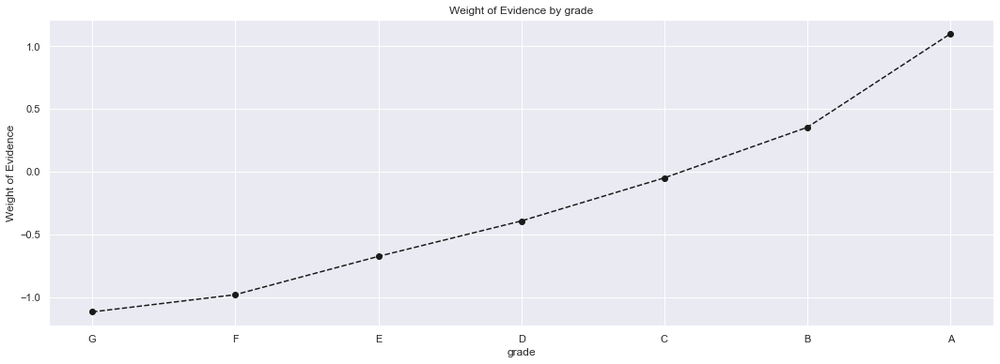

In [240]:
plot_by_woe(df_temp)

# Preprocessing Continuous Variables: Automating Calculation and Visualizing Results

In [271]:
def woe_ordered_continuous(df, discrete_variabe_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    #df = df.sort_values(['WoE'])
    #df = df.reset_index(drop = True)
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df



# Preprocessing Discrete Variables: Creating Dummy Variables, Part 1 

In [242]:
df_temp = woe_discrete(df_inputs_prepr,'home_ownership',df_targets_prepr)
df_temp

,home_ownership,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,OTHER,137,0.795620,0.000367,109.0,28.0,0.000327,0.000698,-0.756876,NaN,NaN,inf
1,NONE,40,0.850000,0.000107,34.0,6.0,0.000102,0.000150,-0.381418,0.054380,0.375458,inf
2,RENT,150599,0.876062,0.403720,131934.0,18665.0,0.396306,0.465241,-0.160367,0.026062,0.221051,inf
3,OWN,33295,0.894338,0.089256,29777.0,3518.0,0.089445,0.087689,0.019824,0.018277,0.180192,inf
4,MORTGAGE,188956,0.905258,0.506546,171054.0,17902.0,0.513816,0.446222,0.141048,0.010920,0.121223,inf
5,ANY,1,1.000000,0.000003,1.0,0.0,0.000003,0.000000,inf,0.094742,inf,inf


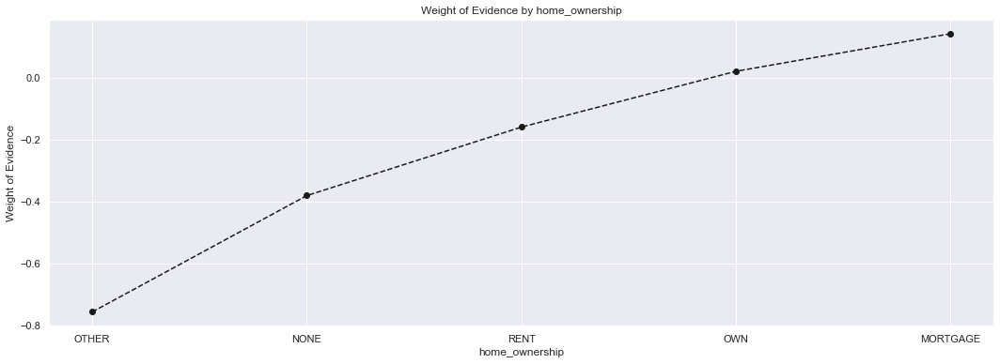

In [243]:
plot_by_woe(df_temp)

In [245]:
df_inputs_prepr['home_ownership:RENT_OTHER_NONE_ANY'] = sum([df_inputs_prepr['home_ownership:RENT'],df_inputs_prepr['home_ownership:OTHER']
                                                                                                                   ,df_inputs_prepr['home_ownership:NONE'],df_inputs_prepr['home_ownership:ANY']])

# Preprocessing Discrete Variables: Creating Dummy Variables, Part 2

In [247]:
df_inputs_prepr['addr_state'].unique()

array(['SC', 'NJ', 'GA', 'MA', 'CA', 'IL', 'NC', 'NY', 'TX', 'CT', 'FL',
       'VA', 'UT', 'AZ', 'MD', 'WI', 'MI', 'CO', 'TN', 'IN', 'AL', 'NV',
       'MT', 'RI', 'OR', 'MN', 'KS', 'AK', 'PA', 'OH', 'WA', 'KY', 'OK',
       'MO', 'NM', 'HI', 'WV', 'LA', 'VT', 'AR', 'DC', 'SD', 'NH', 'WY',
       'MS', 'DE', 'IA', 'NE', 'ID', 'ME'], dtype=object)

In [252]:
df_temp = woe_discrete(df_inputs_prepr,'addr_state',df_targets_prepr)
df_temp

,addr_state,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,NE,13,0.461538,0.000035,6.0,7.0,0.000018,0.000174,-2.270170,NaN,NaN,inf
1,IA,13,0.769231,0.000035,10.0,3.0,0.000030,0.000075,-0.912046,0.307692,1.358123,inf
2,NV,5221,0.867458,0.013996,4529.0,692.0,0.013604,0.017249,-0.237349,0.098228,0.674698,inf
3,FL,25211,0.877672,0.067585,22127.0,3084.0,0.066466,0.076871,-0.145448,0.010214,0.091901,inf
4,AL,4671,0.878185,0.012522,4102.0,569.0,0.012322,0.014183,-0.140670,0.000512,0.004778,inf
5,HI,2001,0.878561,0.005364,1758.0,243.0,0.005281,0.006057,-0.137149,0.000376,0.003521,inf
6,NM,2075,0.884819,0.005563,1836.0,239.0,0.005515,0.005957,-0.077138,0.006259,0.060010,inf
7,VA,11366,0.885184,0.030470,10061.0,1305.0,0.030221,0.032528,-0.073556,0.000365,0.003583,inf
8,OK,3284,0.885505,0.008804,2908.0,376.0,0.008735,0.009372,-0.070387,0.000322,0.003168,inf
9,NY,32211,0.885971,0.086350,28538.0,3673.0,0.085723,0.091553,-0.065791,0.000465,0.004596,inf


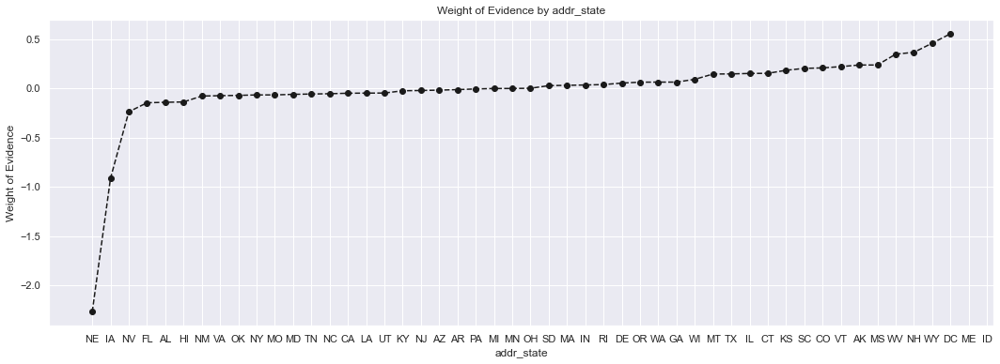

In [250]:
plot_by_woe(df_temp)

In [253]:
if ['addr_state:ND'] in df_inputs_prepr.values:
    pass
else:
    df_inputs_prepr['addr_state:ND'] = 0 

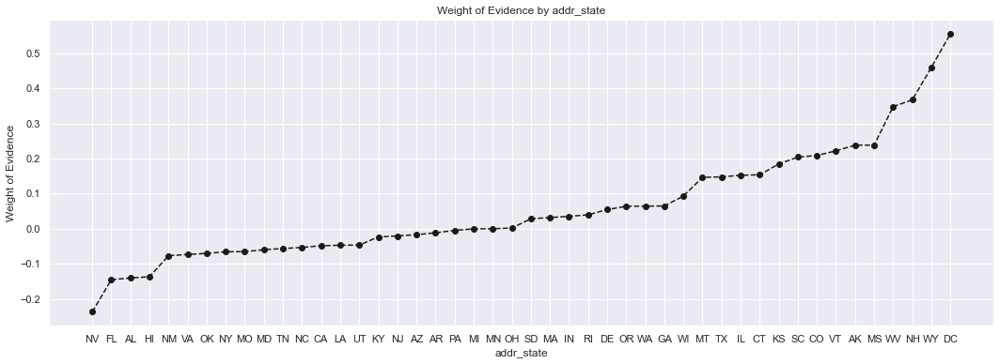

In [256]:
plot_by_woe(df_temp.iloc[2:-2,:])

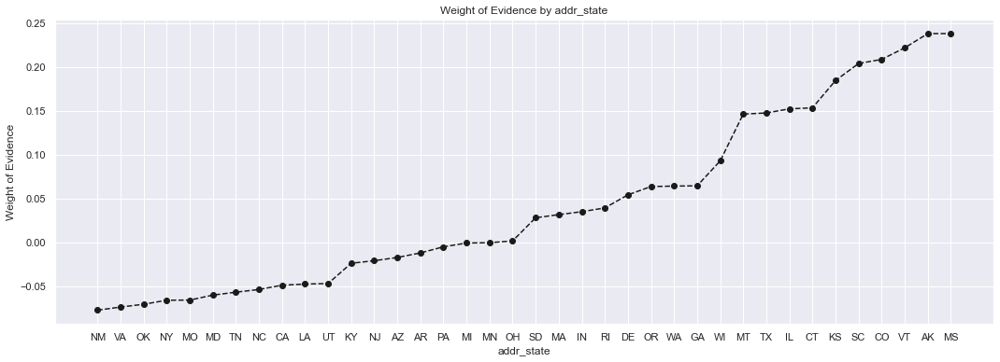

In [257]:
plot_by_woe(df_temp.iloc[6:-6,:])

In [258]:
# We create the following categories:
# 'ND' 'NE' 'IA' NV' 'FL' 'HI' 'AL'
# 'NM' 'VA'
# 'NY'
# 'OK' 'TN' 'MO' 'LA' 'MD' 'NC'
# 'CA'
# 'UT' 'KY' 'AZ' 'NJ'
# 'AR' 'MI' 'PA' 'OH' 'MN'
# 'RI' 'MA' 'DE' 'SD' 'IN'
# 'GA' 'WA' 'OR'
# 'WI' 'MT'
# 'TX'
# 'IL' 'CT'
# 'KS' 'SC' 'CO' 'VT' 'AK' 'MS'
# 'WV' 'NH' 'WY' 'DC' 'ME' 'ID'

# 'IA_NV_HI_ID_AL_FL' will be the reference category.

df_inputs_prepr['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_inputs_prepr['addr_state:ND'], df_inputs_prepr['addr_state:NE'],
                                              df_inputs_prepr['addr_state:IA'], df_inputs_prepr['addr_state:NV'],
                                              df_inputs_prepr['addr_state:FL'], df_inputs_prepr['addr_state:HI'],
                                                          df_inputs_prepr['addr_state:AL']])

df_inputs_prepr['addr_state:NM_VA'] = sum([df_inputs_prepr['addr_state:NM'], df_inputs_prepr['addr_state:VA']])

df_inputs_prepr['addr_state:OK_TN_MO_LA_MD_NC'] = sum([df_inputs_prepr['addr_state:OK'], df_inputs_prepr['addr_state:TN'],
                                              df_inputs_prepr['addr_state:MO'], df_inputs_prepr['addr_state:LA'],
                                              df_inputs_prepr['addr_state:MD'], df_inputs_prepr['addr_state:NC']])

df_inputs_prepr['addr_state:UT_KY_AZ_NJ'] = sum([df_inputs_prepr['addr_state:UT'], df_inputs_prepr['addr_state:KY'],
                                              df_inputs_prepr['addr_state:AZ'], df_inputs_prepr['addr_state:NJ']])

df_inputs_prepr['addr_state:AR_MI_PA_OH_MN'] = sum([df_inputs_prepr['addr_state:AR'], df_inputs_prepr['addr_state:MI'],
                                              df_inputs_prepr['addr_state:PA'], df_inputs_prepr['addr_state:OH'],
                                              df_inputs_prepr['addr_state:MN']])

df_inputs_prepr['addr_state:RI_MA_DE_SD_IN'] = sum([df_inputs_prepr['addr_state:RI'], df_inputs_prepr['addr_state:MA'],
                                              df_inputs_prepr['addr_state:DE'], df_inputs_prepr['addr_state:SD'],
                                              df_inputs_prepr['addr_state:IN']])

df_inputs_prepr['addr_state:GA_WA_OR'] = sum([df_inputs_prepr['addr_state:GA'], df_inputs_prepr['addr_state:WA'],
                                              df_inputs_prepr['addr_state:OR']])

df_inputs_prepr['addr_state:WI_MT'] = sum([df_inputs_prepr['addr_state:WI'], df_inputs_prepr['addr_state:MT']])

df_inputs_prepr['addr_state:IL_CT'] = sum([df_inputs_prepr['addr_state:IL'], df_inputs_prepr['addr_state:CT']])

df_inputs_prepr['addr_state:KS_SC_CO_VT_AK_MS'] = sum([df_inputs_prepr['addr_state:KS'], df_inputs_prepr['addr_state:SC'],
                                              df_inputs_prepr['addr_state:CO'], df_inputs_prepr['addr_state:VT'],
                                              df_inputs_prepr['addr_state:AK'], df_inputs_prepr['addr_state:MS']])

df_inputs_prepr['addr_state:WV_NH_WY_DC_ME_ID'] = sum([df_inputs_prepr['addr_state:WV'], df_inputs_prepr['addr_state:NH'],
                                              df_inputs_prepr['addr_state:WY'], df_inputs_prepr['addr_state:DC'],
                                              df_inputs_prepr['addr_state:ME'], df_inputs_prepr['addr_state:ID']])

In [261]:
df_inputs_prepr.head(3)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,term_int,earliest_cr_line_date,mths_since_earliest_cr_line,issue_d_date,mths_since_issue_d,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,A5,Supervisor inventory management,3 years,MORTGAGE,77000.0,Source Verified,Mar-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 03/12/14 > I have 5 credit...,debt_consolidation,Debt consolidation,295xx,SC,21.91,0.0,Dec-86,1.0,NaN,NaN,20.0,0.0,30489,53.5,32.0,f,10098.30,10098.30,16765.76000,16765.76,13901.70,2864.06,0.0,0.0,0.0,Jan-16,762.08,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,348253.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57000.0,NaN,

In [262]:
df_inputs_prepr.verification_status.value_counts()

Verified           134414
Source Verified    120030
Not Verified       118584
Name: verification_status, dtype: int64

In [263]:
# 'verification_status'
df_temp = woe_discrete(df_inputs_prepr, 'verification_status', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,verification_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Verified,134414,0.874790,0.360332,117584.0,16830.0,0.353202,0.419502,-0.172029,NaN,NaN,0.020222
1,Source Verified,120030,0.897867,0.321772,107771.0,12259.0,0.323725,0.305566,0.057729,0.023077,0.229758,0.020222
2,Not Verified,118584,0.906986,0.317896,107554.0,11030.0,0.323073,0.274932,0.161355,0.009119,0.103626,0.020222


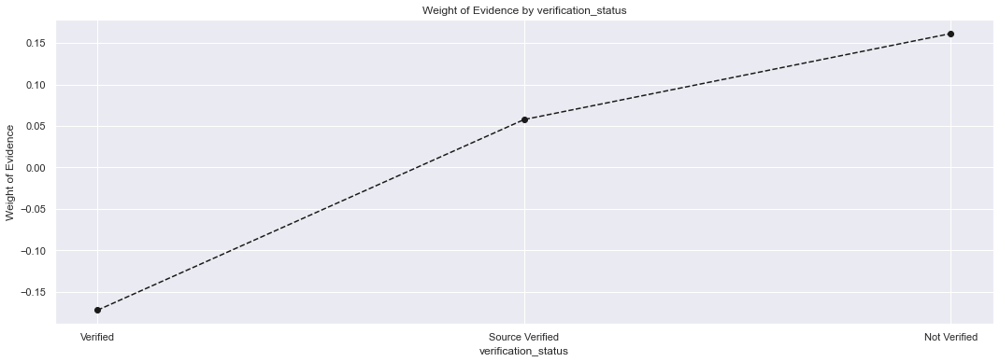

In [264]:
plot_by_woe(df_temp)

In [265]:
df_temp = woe_discrete(df_inputs_prepr, 'purpose', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,purpose,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,small_business,5582,0.788069,0.014964,4399.0,1183.0,0.013214,0.029487,-0.802695,NaN,NaN,0.035855
1,educational,333,0.801802,0.000893,267.0,66.0,0.000802,0.001645,-0.718425,0.013733,0.084270,0.035855
2,moving,2392,0.841137,0.006412,2012.0,380.0,0.006044,0.009472,-0.449306,0.039335,0.269119,0.035855
3,house,1830,0.862842,0.004906,1579.0,251.0,0.004743,0.006256,-0.276925,0.021704,0.172381,0.035855
4,other,18884,0.863853,0.050624,16313.0,2571.0,0.049001,0.064084,-0.268352,0.001011,0.008573,0.035855
5,renewable_energy,281,0.864769,0.000753,243.0,38.0,0.000730,0.000947,-0.260544,0.000916,0.007808,0.035855
6,medical,3684,0.869707,0.009876,3204.0,480.0,0.009624,0.011964,-0.217650,0.004938,0.042894,0.035855
7,wedding,1887,0.881823,0.005059,1664.0,223.0,0.004998,0.005558,-0.106211,0.012116,0.111439,0.035855
8,vacation,1991,0.884480,0.005337,1761.0,230.0,0.005290,0.005733,-0.080461,0.002657,0.025750,0.035855
9,debt_consolidation,219183,0.888874,0.587578,194826.0,24357.0,0.585223,0.607119,-0.036732,0.004394,0.043730,0.035855


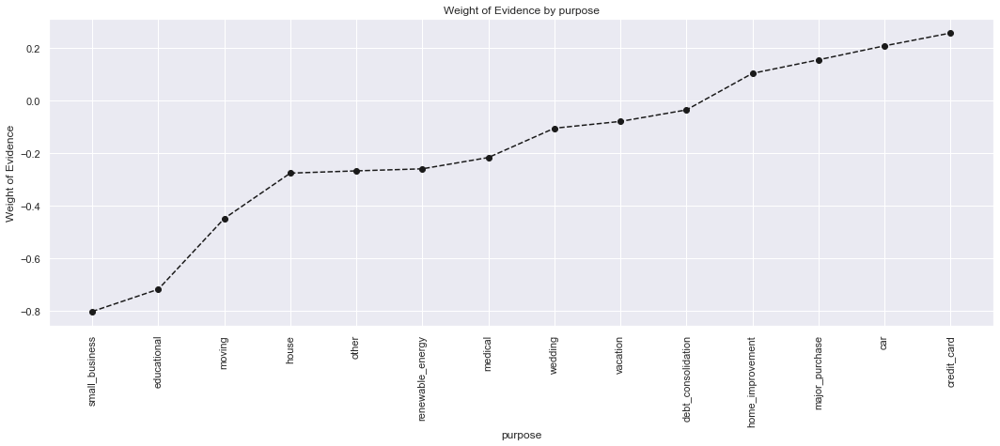

In [266]:
plot_by_woe(df_temp, 90)

In [267]:
# We combine 'educational', 'small_business', 'wedding', 'renewable_energy', 'moving', 'house' in one category: 'educ__sm_b__wedd__ren_en__mov__house'.
# We combine 'other', 'medical', 'vacation' in one category: 'oth__med__vacation'.
# We combine 'major_purchase', 'car', 'home_improvement' in one category: 'major_purch__car__home_impr'.
# We leave 'debt_consolidtion' in a separate category.
# We leave 'credit_card' in a separate category.
# 'educ__sm_b__wedd__ren_en__mov__house' will be the reference category.
df_inputs_prepr['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([df_inputs_prepr['purpose:educational'], df_inputs_prepr['purpose:small_business'],
                                                                 df_inputs_prepr['purpose:wedding'], df_inputs_prepr['purpose:renewable_energy'],
                                                                 df_inputs_prepr['purpose:moving'], df_inputs_prepr['purpose:house']])
df_inputs_prepr['purpose:oth__med__vacation'] = sum([df_inputs_prepr['purpose:other'], df_inputs_prepr['purpose:medical'],
                                             df_inputs_prepr['purpose:vacation']])
df_inputs_prepr['purpose:major_purch__car__home_impr'] = sum([df_inputs_prepr['purpose:major_purchase'], df_inputs_prepr['purpose:car'],
                                                        df_inputs_prepr['purpose:home_improvement']])

In [268]:
df_temp = woe_discrete(df_inputs_prepr, 'initial_list_status', df_targets_prepr)
df_temp

,initial_list_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,f,242514,0.881203,0.650123,213704.0,28810.0,0.641929,0.718114,-0.112150,NaN,NaN,0.026769
1,w,130514,0.913350,0.349877,119205.0,11309.0,0.358071,0.281886,0.239227,0.032148,0.351377,0.026769


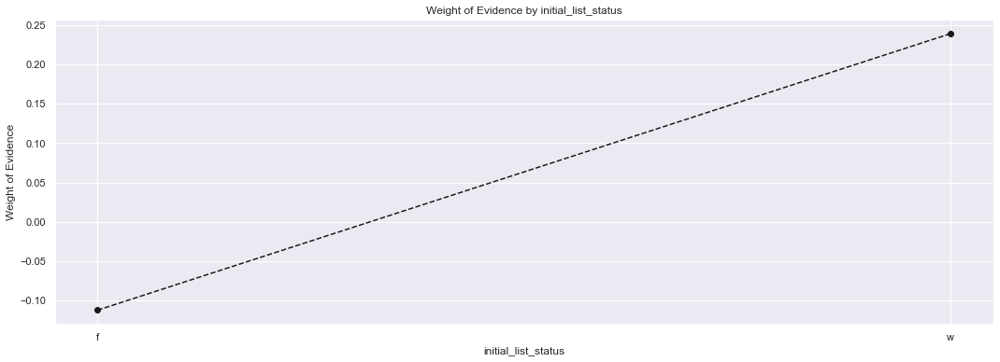

In [269]:
plot_by_woe(df_temp)

# Preprocessing Continuous Variable: Creating Dummy Variable, Part 1

In [274]:
df_inputs_prepr['term_int'].unique()

array([36, 60])

In [275]:
df_temp = woe_ordered_continuous(df_inputs_prepr,'term_int',df_targets_prepr)
df_temp

,term_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,36,270419,0.90443,0.724929,244575.0,25844.0,0.73466,0.644184,0.131424,NaN,NaN,0.038437
1,60,102609,0.86088,0.275071,88334.0,14275.0,0.26534,0.355816,-0.293404,0.04355,0.424828,0.038437


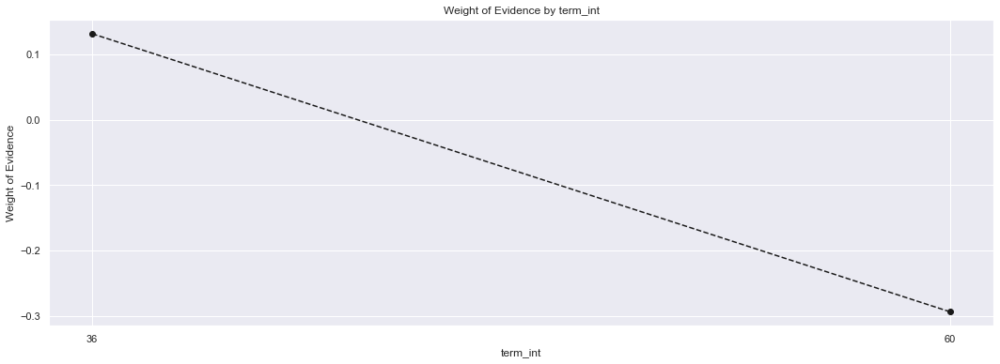

In [276]:
plot_by_woe(df_temp)

In [277]:
df_inputs_prepr['term:36'] = np.where((df_inputs_prepr['term_int'] == 36),1,0)
df_inputs_prepr['term:60'] = np.where((df_inputs_prepr['term_int'] == 60),1,0)

In [278]:
df_temp = woe_ordered_continuous(df_inputs_prepr,'emp_length_int',df_targets_prepr)
df_temp

,emp_length_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,45720,0.878150,0.122565,40149.0,5571.0,0.120601,0.138862,-0.140996,NaN,NaN,0.006665
1,1.0,23654,0.889363,0.063411,21037.0,2617.0,0.063191,0.065231,-0.031765,0.011214,0.109231,0.006665
2,2.0,33078,0.892285,0.088674,29515.0,3563.0,0.088658,0.088811,-0.001723,0.002922,0.030042,0.006665
3,3.0,29205,0.892553,0.078292,26067.0,3138.0,0.078301,0.078217,0.001065,0.000268,0.002789,0.006665
4,4.0,22468,0.891980,0.060231,20041.0,2427.0,0.060200,0.060495,-0.004895,0.000573,0.005960,0.006665
5,5.0,24602,0.886554,0.065952,21811.0,2791.0,0.065516,0.069568,-0.060005,0.005426,0.055110,0.006665
6,6.0,20887,0.885431,0.055993,18494.0,2393.0,0.055553,0.059648,-0.071121,0.001123,0.011116,0.006665
7,7.0,21049,0.889353,0.056427,18720.0,2329.0,0.056232,0.058052,-0.031866,0.003922,0.039255,0.006665
8,8.0,17853,0.891951,0.047860,15924.0,1929.0,0.047833,0.048082,-0.005193,0.002598,0.026672,0.006665
9,9.0,14267,0.888834,0.038246,12681.0,1586.0,0.038091,0.039532,-0.037129,0.003117,0.031936,0.006665


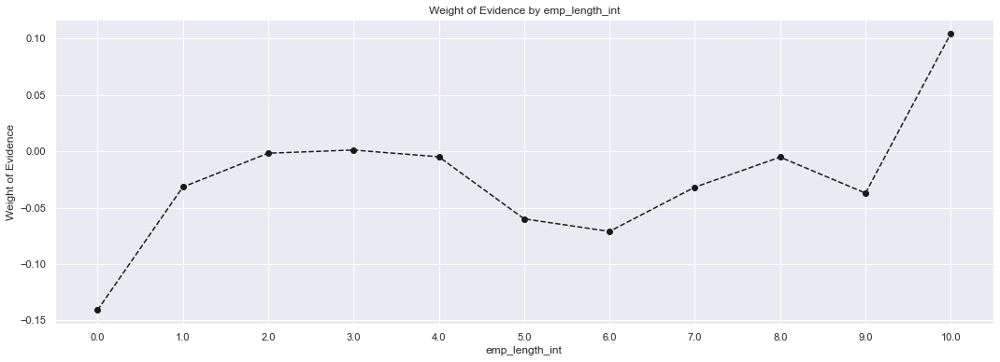

In [279]:
plot_by_woe(df_temp)

In [280]:
# We create the following categories: '0', '1', '2 - 4', '5 - 6', '7 - 9', '10'
# '0' will be the reference category
df_inputs_prepr['emp_length:0'] = np.where(df_inputs_prepr['emp_length_int'].isin([0]), 1, 0)
df_inputs_prepr['emp_length:1'] = np.where(df_inputs_prepr['emp_length_int'].isin([1]), 1, 0)
df_inputs_prepr['emp_length:2-4'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(2, 5)), 1, 0)
df_inputs_prepr['emp_length:5-6'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(5, 7)), 1, 0)
df_inputs_prepr['emp_length:7-9'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(7, 10)), 1, 0)
df_inputs_prepr['emp_length:10'] = np.where(df_inputs_prepr['emp_length_int'].isin([10]), 1, 0)

# Preprocessing Continuous Variables: Creating Dummy Variable Part 2 

In [295]:
df_inputs_prepr['mths_since_issue_d'].unique()

array([ 45.,  64.,  54.,  44., 101.,  37.,  91.,  53.,  42.,  57.,  58.,
        43.,  40.,  51.,  59., 113.,  50.,  62.,  49.,  47.,  48.,  41.,
        38.,  66.,  69.,  87.,  46.,  76.,  63.,  39.,  61.,  89.,  65.,
        56.,  79.,  68.,  52.,  60.,  73.,  74.,  70.,  88.,  81.,  82.,
        55., 103.,  83.,  72.,  85.,  36.,  71.,  92.,  77.,  67.,  84.,
        86.,  90., 116.,  93.,  95.,  78.,  75.,  80.,  96.,  94.,  98.,
       104., 125., 105., 118., 110., 119., 114.,  97., 102., 106., 100.,
       122., 121., 108., 117., 120., 124.,  99., 115., 112., 109., 123.,
       107., 126., 111.])

In [296]:
df_inputs_prepr['mths_since_issues_d_factors'] = pd.cut(df_inputs_prepr['mths_since_issue_d'],50)
df_inputs_prepr['mths_since_issues_d_factors']

427211      (43.2, 45.0]
206088      (63.0, 64.8]
136020      (52.2, 54.0]
412305      (43.2, 45.0]
36159     (100.8, 102.6]
260400     (35.91, 37.8]
29626       (90.0, 91.8]
117003      (52.2, 54.0]
378696      (41.4, 43.2]
159555      (55.8, 57.6]
258931     (35.91, 37.8]
435023      (43.2, 45.0]
434939      (43.2, 45.0]
166714      (57.6, 59.4]
397514      (41.4, 43.2]
412695      (43.2, 45.0]
326791      (39.6, 41.4]
399112      (41.4, 43.2]
386208      (41.4, 43.2]
90207       (50.4, 52.2]
177298      (57.6, 59.4]
41491     (111.6, 113.4]
84297       (48.6, 50.4]
193825      (61.2, 63.0]
391693      (41.4, 43.2]
431675      (43.2, 45.0]
66434       (48.6, 50.4]
454638      (46.8, 48.6]
89746       (50.4, 52.2]
50163       (46.8, 48.6]
367344      (41.4, 43.2]
349219      (39.6, 41.4]
346074      (39.6, 41.4]
290389      (37.8, 39.6]
214844      (64.8, 66.6]
222888      (68.4, 70.2]
122435      (52.2, 54.0]
465903      (46.8, 48.6]
390024      (41.4, 43.2]
377139      (41.4, 43.2]


In [297]:
df_temp = woe_ordered_continuous(df_inputs_prepr,'mths_since_issues_d_factors',df_targets_prepr)
df_temp 

,mths_since_issues_d_factors,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(35.91, 37.8]",28170,0.945048,0.075517,26622.0,1548.0,0.079968,0.038585,0.728755,NaN,NaN,0.122293
1,"(37.8, 39.6]",39636,0.930543,0.106255,36883.0,2753.0,0.110790,0.068621,0.479040,0.014505,0.249715,0.122293
2,"(39.6, 41.4]",38614,0.920107,0.103515,35529.0,3085.0,0.106723,0.076896,0.327778,0.010436,0.151262,0.122293
3,"(41.4, 43.2]",29038,0.911426,0.077844,26466.0,2572.0,0.079499,0.064109,0.215158,0.008680,0.112621,0.122293
4,"(43.2, 45.0]",28367,0.904431,0.076045,25656.0,2711.0,0.077066,0.067574,0.131441,0.006995,0.083717,0.122293
5,"(45.0, 46.8]",12165,0.901521,0.032611,10967.0,1198.0,0.032943,0.029861,0.098218,0.002910,0.033223,0.122293
6,"(46.8, 48.6]",24451,0.900536,0.065547,22019.0,2432.0,0.066141,0.060620,0.087173,0.000985,0.011046,0.122293
7,"(48.6, 50.4]",22969,0.889721,0.061574,20436.0,2533.0,0.061386,0.063137,-0.028125,0.010815,0.115298,0.122293
8,"(50.4, 52.2]",20640,0.882316,0.055331,18211.0,2429.0,0.054703,0.060545,-0.101473,0.007405,0.073348,0.122293
9,"(52.2, 54.0]",18312,0.867682,0.049090,15889.0,2423.0,0.047728,0.060395,-0.235399,0.014633,0.133926,0.122293


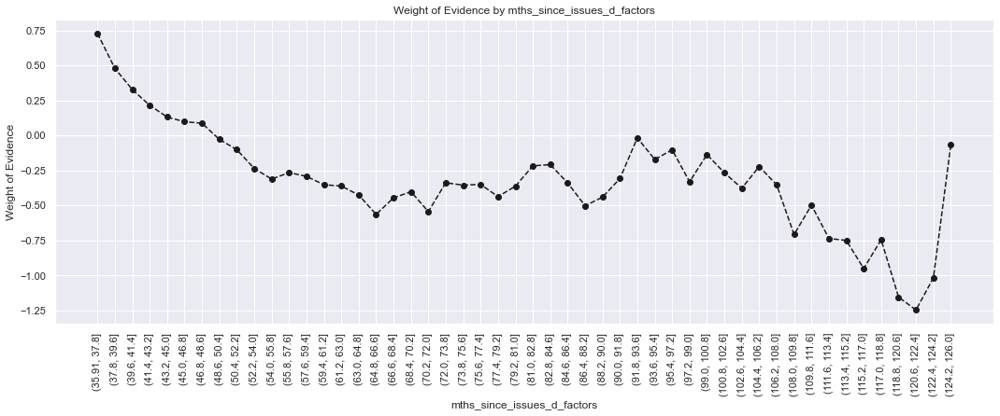

In [298]:
plot_by_woe(df_temp,rotation_of_x_axis_labels=90)

In [299]:
# We create the following categories:
# < 38, 38 - 39, 40 - 41, 42 - 48, 49 - 52, 53 - 64, 65 - 84, > 84.
df_inputs_prepr['mths_since_issue_d:<38'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(38)), 1, 0)
df_inputs_prepr['mths_since_issue_d:38-39'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(38, 40)), 1, 0)
df_inputs_prepr['mths_since_issue_d:40-41'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(40, 42)), 1, 0)
df_inputs_prepr['mths_since_issue_d:42-48'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(42, 49)), 1, 0)
df_inputs_prepr['mths_since_issue_d:49-52'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(49, 53)), 1, 0)
df_inputs_prepr['mths_since_issue_d:53-64'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(53, 65)), 1, 0)
df_inputs_prepr['mths_since_issue_d:65-84'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(65, 85)), 1, 0)
df_inputs_prepr['mths_since_issue_d:>84'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(85, int(df_inputs_prepr['mths_since_issue_d'].max()))), 1, 0)

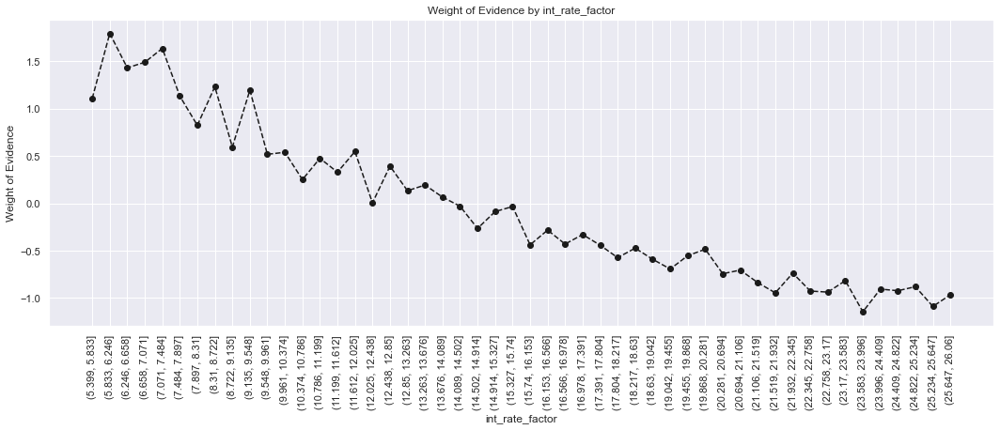

In [301]:
df_inputs_prepr['int_rate_factor'] = pd.cut(df_inputs_prepr['int_rate'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'int_rate_factor', df_targets_prepr)
plot_by_woe(df_temp, 90)

In [303]:
df_temp

,int_rate_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(5.399, 5.833]",785,0.961783,0.002104,755.0,30.0,0.002268,0.000748,1.109501,NaN,NaN,0.341624
1,"(5.833, 6.246]",8459,0.980376,0.022677,8293.0,166.0,0.024911,0.004138,1.795160,0.018592,0.685659,0.341624
2,"(6.246, 6.658]",7826,0.972016,0.020980,7607.0,219.0,0.022850,0.005459,1.431733,0.008360,0.363427,0.341624
3,"(6.658, 7.071]",1816,0.973568,0.004868,1768.0,48.0,0.005311,0.001196,1.490384,0.001552,0.058651,0.341624
4,"(7.071, 7.484]",3143,0.977092,0.008426,3071.0,72.0,0.009225,0.001795,1.637073,0.003524,0.146689,0.341624
5,"(7.484, 7.897]",12581,0.962642,0.033727,12111.0,470.0,0.036379,0.011715,1.133118,0.014450,0.503956,0.341624
6,"(7.897, 8.31]",9687,0.949830,0.025969,9201.0,486.0,0.027638,0.012114,0.824840,0.012812,0.308278,0.341624
7,"(8.31, 8.722]",6594,0.966030,0.017677,6370.0,224.0,0.019134,0.005583,1.231690,0.016200,0.406850,0.341624
8,"(8.722, 9.135]",9539,0.937729,0.025572,8945.0,594.0,0.026869,0.014806,0.595952,0.028300,0.635738,0.341624
9,"(9.135, 9.548]",6681,0.964826,0.017910,6446.0,235.0,0.019363,0.005858,1.195610,0.027096,0.599659,0.341624


In [304]:
# '< 9.548', '9.548 - 12.025', '12.025 - 15.74', '15.74 - 20.281', '> 20.281'
df_inputs_prepr['int_rate:<9.548'] = np.where((df_inputs_prepr['int_rate'] <= 9.548), 1, 0)
df_inputs_prepr['int_rate:9.548-12.025'] = np.where((df_inputs_prepr['int_rate'] > 9.548) & (df_inputs_prepr['int_rate'] <= 12.025), 1, 0)
df_inputs_prepr['int_rate:12.025-15.74'] = np.where((df_inputs_prepr['int_rate'] > 12.025) & (df_inputs_prepr['int_rate'] <= 15.74), 1, 0)
df_inputs_prepr['int_rate:15.74-20.281'] = np.where((df_inputs_prepr['int_rate'] > 15.74) & (df_inputs_prepr['int_rate'] <= 20.281), 1, 0)
df_inputs_prepr['int_rate:>20.281'] = np.where((df_inputs_prepr['int_rate'] > 20.281), 1, 0)

In [305]:
df_inputs_prepr['funded_amnt_factor'] = pd.cut(df_inputs_prepr['funded_amnt'], 50)
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'funded_amnt_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,funded_amnt_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(465.5, 1190.0]",1224,0.906863,0.003281,1110.0,114.0,0.003334,0.002842,0.159898,NaN,NaN,0.014171
1,"(1190.0, 1880.0]",3028,0.904888,0.008117,2740.0,288.0,0.008230,0.007179,0.136734,0.001975,0.023164,0.014171
2,"(1880.0, 2570.0]",6018,0.894317,0.016133,5382.0,636.0,0.016167,0.015853,0.019598,0.010571,0.117136,0.014171
3,"(2570.0, 3260.0]",7248,0.889625,0.019430,6448.0,800.0,0.019369,0.019941,-0.029106,0.004692,0.048703,0.014171
4,"(3260.0, 3950.0]",4751,0.893707,0.012736,4246.0,505.0,0.012754,0.012588,0.013155,0.004082,0.042261,0.014171
5,"(3950.0, 4640.0]",9023,0.892608,0.024189,8054.0,969.0,0.024193,0.024153,0.001640,0.001099,0.011515,0.014171
6,"(4640.0, 5330.0]",15903,0.893291,0.042632,14206.0,1697.0,0.042672,0.042299,0.008783,0.000683,0.007143,0.014171
7,"(5330.0, 6020.0]",17236,0.907925,0.046206,15649.0,1587.0,0.047007,0.039557,0.172542,0.014635,0.163759,0.014171
8,"(6020.0, 6710.0]",6914,0.889066,0.018535,6147.0,767.0,0.018465,0.019118,-0.034787,0.018860,0.207329,0.014171
9,"(6710.0, 7400.0]",11806,0.899204,0.031649,10616.0,1190.0,0.031889,0.029662,0.072390,0.010138,0.107176,0.014171


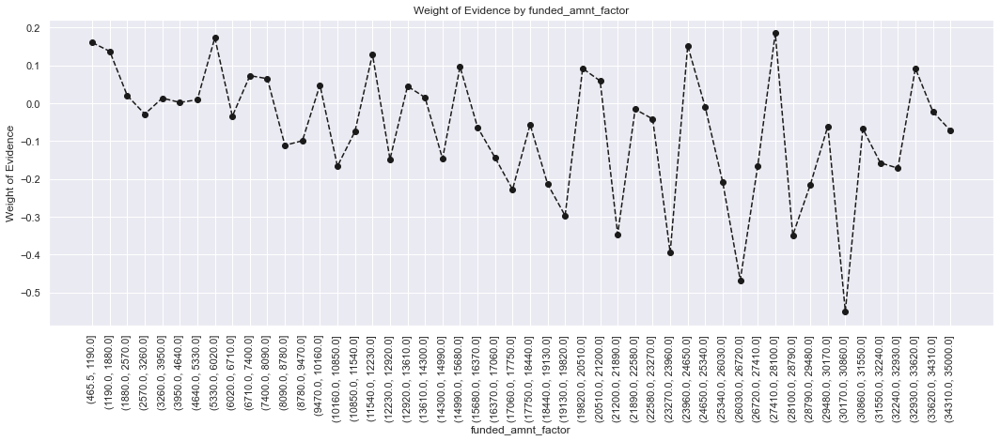

In [307]:
# up and down , can drop the column 
plot_by_woe(df_temp, 90)

In [310]:
df_inputs_prepr[['mths_since_earliest_cr_line']].head(5)

,mths_since_earliest_cr_line
427211,372.0
206088,240.0
136020,317.0
412305,230.0
36159,233.0


In [311]:
# mths_since_earliest_cr_line
df_inputs_prepr['mths_since_earliest_cr_line_factor'] = pd.cut(df_inputs_prepr['mths_since_earliest_cr_line'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'mths_since_earliest_cr_line_factor', df_targets_prepr)
df_temp

,mths_since_earliest_cr_line_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.587, 11.74]",24,0.875000,0.000064,21.0,3.0,0.000063,0.000075,-0.170109,NaN,NaN,0.01605
1,"(11.74, 23.48]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01605
2,"(23.48, 35.22]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01605
3,"(35.22, 46.96]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01605
4,"(46.96, 58.7]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01605
5,"(58.7, 70.44]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01605
6,"(70.44, 82.18]",722,0.905817,0.001936,654.0,68.0,0.001965,0.001695,0.147581,NaN,NaN,0.01605
7,"(82.18, 93.92]",1929,0.887506,0.005171,1712.0,217.0,0.005143,0.005409,-0.050499,0.018311,0.198079,0.01605
8,"(93.92, 105.66]",2817,0.859070,0.007552,2420.0,397.0,0.007269,0.009896,-0.308433,0.028437,0.257934,0.01605
9,"(105.66, 117.4]",5092,0.875098,0.013650,4456.0,636.0,0.013385,0.015853,-0.169211,0.016028,0.139222,0.01605


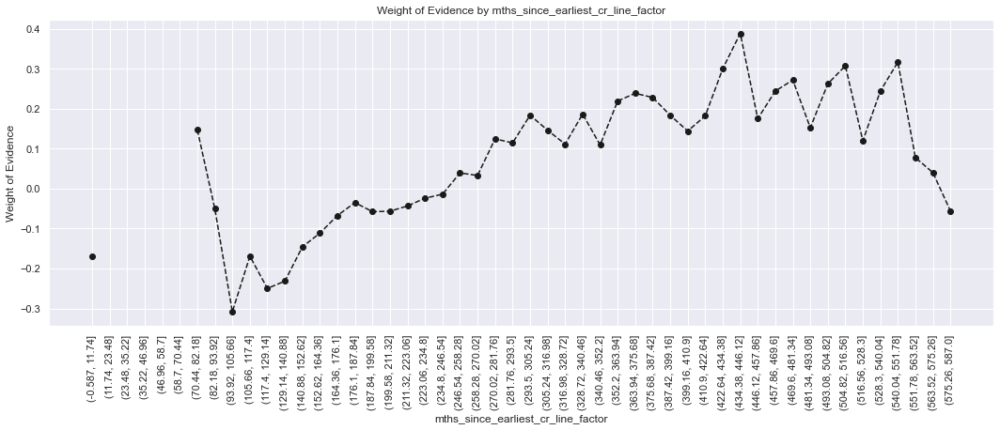

In [312]:
plot_by_woe(df_temp, 90)

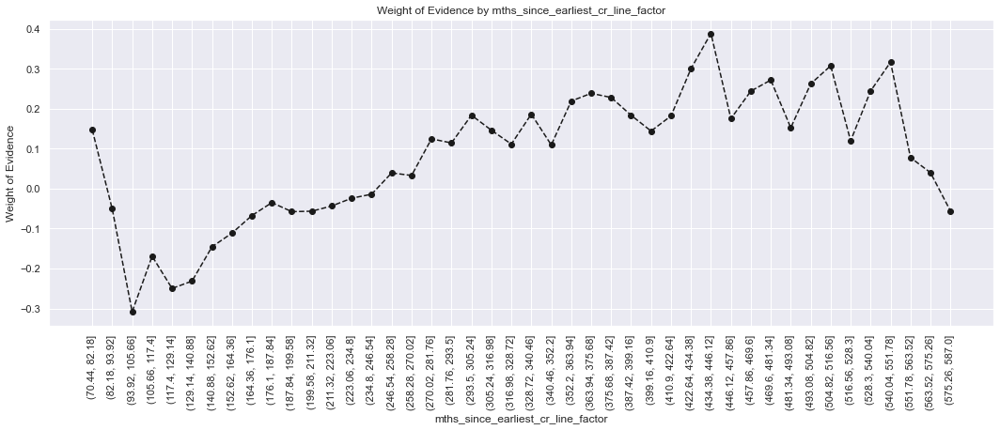

In [313]:
plot_by_woe(df_temp.iloc[6: , : ], 90)

In [314]:
# We create the following categories:
# < 140, # 141 - 164, # 165 - 247, # 248 - 270, # 271 - 352, # > 352
df_inputs_prepr['mths_since_earliest_cr_line:<140'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(140)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:141-164'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(140, 165)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:165-247'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(165, 248)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:248-270'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(248, 271)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:271-352'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(271, 353)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:>352'] = np.where(df_inputs_prepr['mths_since_earliest_cr_line'].isin(range(353, int(df_inputs_prepr['mths_since_earliest_cr_line'].max()))), 1, 0)

In [315]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'delinq_2yrs', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,delinq_2yrs,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,306417,0.892212,0.821432,273389.0,33028.0,0.821212,0.823251,-0.002479,NaN,NaN,inf
1,1.0,44927,0.894963,0.120439,40208.0,4719.0,0.120778,0.117625,0.026450,0.002751,0.028929,inf
2,2.0,13118,0.891523,0.035166,11695.0,1423.0,0.035130,0.035469,-0.009625,0.003440,0.036075,inf
3,3.0,4550,0.885714,0.012197,4030.0,520.0,0.012105,0.012961,-0.068326,0.005809,0.058701,inf
4,4.0,1868,0.901499,0.005008,1684.0,184.0,0.005058,0.004586,0.097972,0.015785,0.166299,inf
5,5.0,966,0.883023,0.002590,853.0,113.0,0.002562,0.002817,-0.094647,0.018476,0.192620,inf
6,6.0,501,0.908184,0.001343,455.0,46.0,0.001367,0.001147,0.175637,0.025161,0.270284,inf
7,7.0,279,0.867384,0.000748,242.0,37.0,0.000727,0.000922,-0.237999,0.040800,0.413636,inf
8,8.0,148,0.912162,0.000397,135.0,13.0,0.000406,0.000324,0.224306,0.044779,0.462306,inf
9,9.0,89,0.898876,0.000239,80.0,9.0,0.000240,0.000224,0.068783,0.013286,0.155523,inf


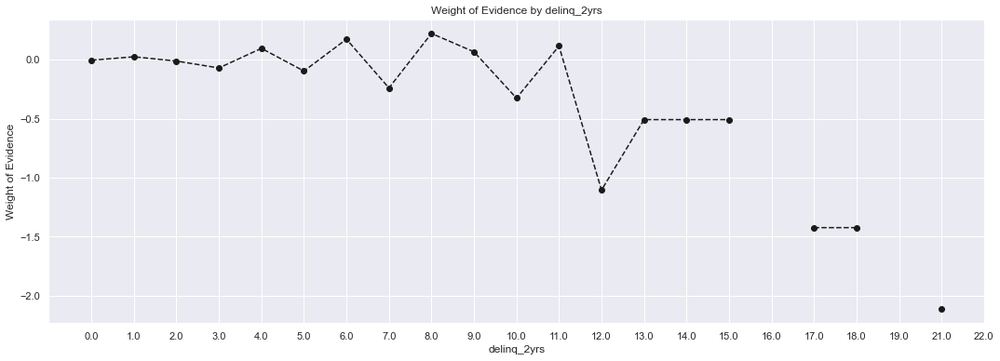

In [316]:
plot_by_woe(df_temp)

In [317]:
# Categories: 0, 1-3, >=4
df_inputs_prepr['delinq_2yrs:0'] = np.where((df_inputs_prepr['delinq_2yrs'] == 0), 1, 0)
df_inputs_prepr['delinq_2yrs:1-3'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 1) & (df_inputs_prepr['delinq_2yrs'] <= 3), 1, 0)
df_inputs_prepr['delinq_2yrs:>=4'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 9), 1, 0)

In [318]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'inq_last_6mths', df_targets_prepr)
df_temp

/Users/eric/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,inq_last_6mths,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,193232,0.910056,0.518009,175852.0,17380.0,0.528228,0.433211,0.198303,NaN,NaN,inf
1,1.0,104163,0.886783,0.279236,92370.0,11793.0,0.277463,0.293950,-0.057723,0.023273,0.256026,inf
2,2.0,46214,0.865863,0.123889,40015.0,6199.0,0.120198,0.154515,-0.251153,0.020920,0.193430,inf
3,3.0,20040,0.841916,0.053723,16872.0,3168.0,0.050681,0.078965,-0.443464,0.023947,0.192311,inf
4,4.0,5810,0.851119,0.015575,4945.0,865.0,0.014854,0.021561,-0.372616,0.009203,0.070848,inf
5,5.0,2217,0.827244,0.005943,1834.0,383.0,0.005509,0.009547,-0.549799,0.023875,0.177183,inf
6,6.0,977,0.792221,0.002619,774.0,203.0,0.002325,0.005060,-0.777653,0.035023,0.227854,inf
7,7.0,159,0.679245,0.000426,108.0,51.0,0.000324,0.001271,-1.365714,0.112976,0.588060,inf
8,8.0,101,0.643564,0.000271,65.0,36.0,0.000195,0.000897,-1.525151,0.035681,0.159437,inf
9,9.0,43,0.674419,0.000115,29.0,14.0,0.000087,0.000349,-1.387781,0.030854,0.137370,inf


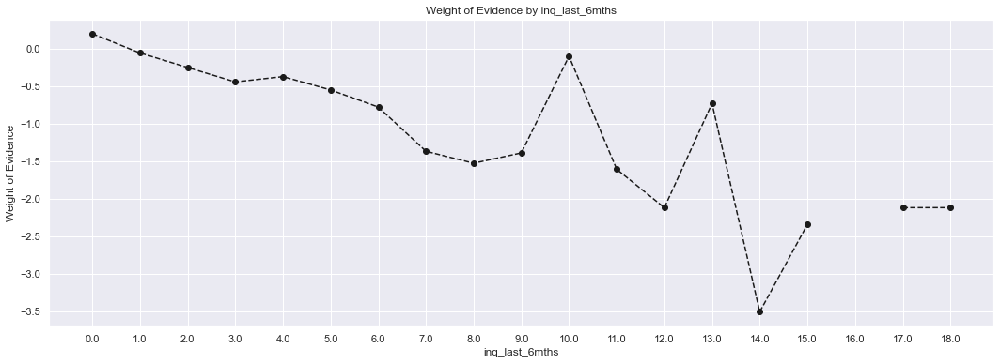

In [319]:
plot_by_woe(df_temp)

In [320]:
# Categories: 0, 1 - 2, 3 - 6, > 6
df_inputs_prepr['inq_last_6mths:0'] = np.where((df_inputs_prepr['inq_last_6mths'] == 0), 1, 0)
df_inputs_prepr['inq_last_6mths:1-2'] = np.where((df_inputs_prepr['inq_last_6mths'] >= 1) & (df_inputs_prepr['inq_last_6mths'] <= 2), 1, 0)
df_inputs_prepr['inq_last_6mths:3-6'] = np.where((df_inputs_prepr['inq_last_6mths'] >= 3) & (df_inputs_prepr['inq_last_6mths'] <= 6), 1, 0)
df_inputs_prepr['inq_last_6mths:>6'] = np.where((df_inputs_prepr['inq_last_6mths'] > 6), 1, 0)

In [321]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'open_acc', df_targets_prepr)

df_temp

/Users/eric/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,open_acc,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,29,0.758621,0.000078,22.0,7.0,0.000066,0.000174,-0.970887,NaN,NaN,inf
1,1.0,110,0.872727,0.000295,96.0,14.0,0.000288,0.000349,-0.190728,0.114107,0.780159,inf
2,2.0,1456,0.847527,0.003903,1234.0,222.0,0.003707,0.005534,-0.400680,0.025200,0.209952,inf
3,3.0,4378,0.875057,0.011736,3831.0,547.0,0.011508,0.013634,-0.169587,0.027530,0.231094,inf
4,4.0,10028,0.892302,0.026883,8948.0,1080.0,0.026878,0.026920,-0.001550,0.017244,0.168037,inf
5,5.0,17141,0.892363,0.045951,15296.0,1845.0,0.045946,0.045988,-0.000907,0.000062,0.000643,inf
6,6.0,24621,0.893912,0.066003,22009.0,2612.0,0.066111,0.065106,0.015316,0.001548,0.016223,inf
7,7.0,30169,0.893102,0.080876,26944.0,3225.0,0.080935,0.080386,0.006809,0.000810,0.008508,inf
8,8.0,33579,0.892790,0.090017,29979.0,3600.0,0.090052,0.089733,0.003544,0.000312,0.003264,inf
9,9.0,35251,0.890783,0.094500,31401.0,3850.0,0.094323,0.095965,-0.017253,0.002007,0.020797,inf


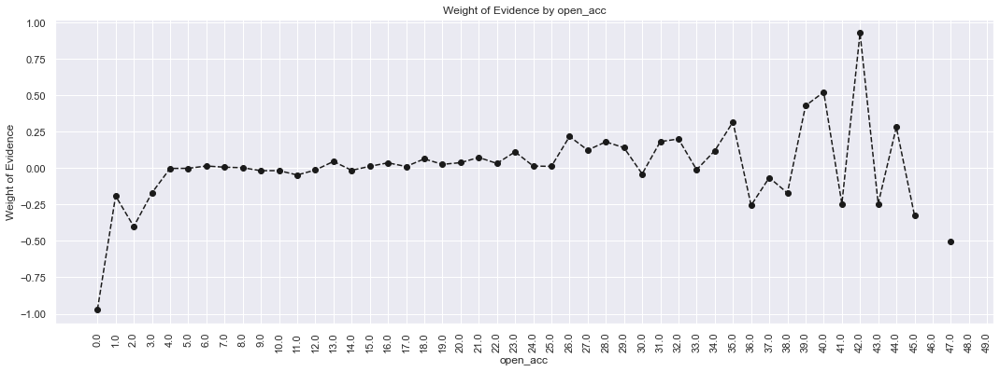

In [322]:
plot_by_woe(df_temp, 90)

In [324]:
# Categories: '0', '1-3', '4-12', '13-17', '18-22', '23-25', '26-30', '>30'
df_inputs_prepr['open_acc:0'] = np.where((df_inputs_prepr['open_acc'] == 0), 1, 0)
df_inputs_prepr['open_acc:1-3'] = np.where((df_inputs_prepr['open_acc'] >= 1) & (df_inputs_prepr['open_acc'] <= 3), 1, 0)
df_inputs_prepr['open_acc:4-12'] = np.where((df_inputs_prepr['open_acc'] >= 4) & (df_inputs_prepr['open_acc'] <= 12), 1, 0)
df_inputs_prepr['open_acc:13-17'] = np.where((df_inputs_prepr['open_acc'] >= 13) & (df_inputs_prepr['open_acc'] <= 17), 1, 0)
df_inputs_prepr['open_acc:18-22'] = np.where((df_inputs_prepr['open_acc'] >= 18) & (df_inputs_prepr['open_acc'] <= 22), 1, 0)
df_inputs_prepr['open_acc:23-25'] = np.where((df_inputs_prepr['open_acc'] >= 23) & (df_inputs_prepr['open_acc'] <= 25), 1, 0)
df_inputs_prepr['open_acc:26-30'] = np.where((df_inputs_prepr['open_acc'] >= 26) & (df_inputs_prepr['open_acc'] <= 30), 1, 0)
df_inputs_prepr['open_acc:>=31'] = np.where((df_inputs_prepr['open_acc'] >= 31), 1, 0)

In [325]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'pub_rec', df_targets_prepr)
df_temp

,pub_rec,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,323999,0.891614,0.868565,288882.0,35117.0,0.867751,0.875321,-0.008686,NaN,NaN,inf
1,1.0,42381,0.895826,0.113613,37966.0,4415.0,0.114043,0.110048,0.035664,0.004212,0.044350,inf
2,2.0,4527,0.905677,0.012136,4100.0,427.0,0.012316,0.010643,0.145939,0.009851,0.110275,inf
3,3.0,1280,0.922656,0.003431,1181.0,99.0,0.003548,0.002468,0.362978,0.016979,0.217039,inf
4,4.0,408,0.926471,0.001094,378.0,30.0,0.001135,0.000748,0.417678,0.003814,0.054700,inf
5,5.0,203,0.911330,0.000544,185.0,18.0,0.000556,0.000449,0.213965,0.015141,0.203713,inf
6,6.0,117,0.931624,0.000314,109.0,8.0,0.000327,0.000199,0.495887,0.020294,0.281922,inf
7,7.0,48,0.958333,0.000129,46.0,2.0,0.000138,0.000050,1.019475,0.026709,0.523588,inf
8,8.0,24,1.000000,0.000064,24.0,0.0,0.000072,0.000000,inf,0.041667,inf,inf
9,9.0,14,0.785714,0.000038,11.0,3.0,0.000033,0.000075,-0.816736,0.214286,inf,inf


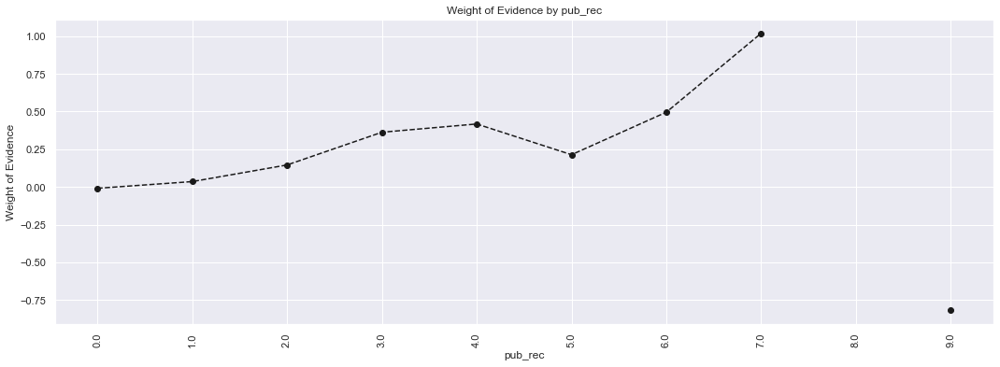

In [326]:
plot_by_woe(df_temp, 90)

In [327]:
df_inputs_prepr['pub_rec:0-2'] = np.where((df_inputs_prepr['pub_rec'] >= 0) & (df_inputs_prepr['pub_rec'] <= 2), 1, 0)
df_inputs_prepr['pub_rec:3-4'] = np.where((df_inputs_prepr['pub_rec'] >= 3) & (df_inputs_prepr['pub_rec'] <= 4), 1, 0)
df_inputs_prepr['pub_rec:>=5'] = np.where((df_inputs_prepr['pub_rec'] >= 5), 1, 0)

In [328]:
df_inputs_prepr['total_acc_factor'] = pd.cut(df_inputs_prepr['total_acc'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'total_acc_factor', df_targets_prepr)
df_temp

,total_acc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.15, 3.0]",459,0.810458,0.001230,372.0,87.0,0.001117,0.002169,-0.663033,NaN,NaN,inf
1,"(3.0, 6.0]",6004,0.866589,0.016095,5203.0,801.0,0.015629,0.019966,-0.244889,0.056131,0.418144,inf
2,"(6.0, 9.0]",15047,0.875125,0.040337,13168.0,1879.0,0.039554,0.046836,-0.168969,0.008536,0.075920,inf
3,"(9.0, 12.0]",25169,0.882792,0.067472,22219.0,2950.0,0.066742,0.073531,-0.096877,0.007668,0.072093,inf
4,"(12.0, 15.0]",33651,0.883272,0.090210,29723.0,3928.0,0.089283,0.097909,-0.092228,0.000480,0.004648,inf
5,"(15.0, 18.0]",38711,0.888869,0.103775,34409.0,4302.0,0.103359,0.107231,-0.036781,0.005596,0.055447,inf
6,"(18.0, 21.0]",40599,0.887928,0.108836,36049.0,4550.0,0.108285,0.113413,-0.046267,0.000941,0.009486,inf
7,"(21.0, 24.0]",40163,0.893185,0.107668,35873.0,4290.0,0.107756,0.106932,0.007679,0.005257,0.053946,inf
8,"(24.0, 27.0]",36286,0.897316,0.097274,32560.0,3726.0,0.097805,0.092874,0.051730,0.004130,0.044051,inf
9,"(27.0, 30.0]",31775,0.900614,0.085181,28617.0,3158.0,0.085960,0.078716,0.088043,0.003298,0.036313,inf


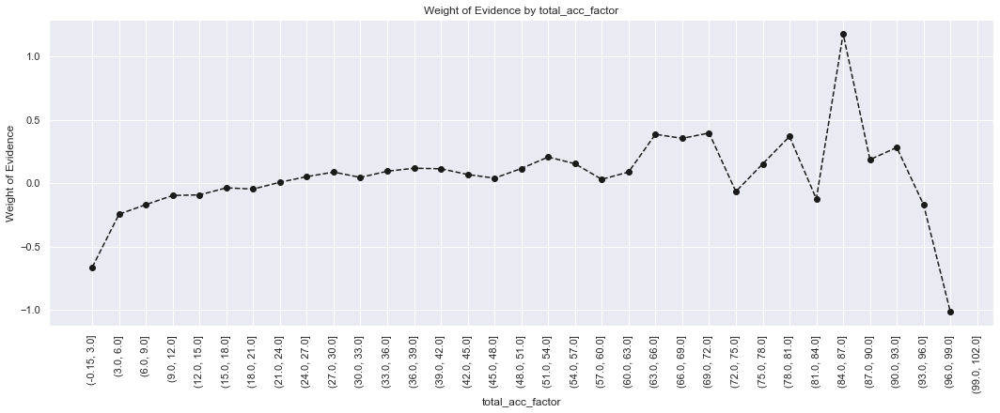

In [329]:
plot_by_woe(df_temp, 90)

In [330]:
df_inputs_prepr['total_acc:<=27'] = np.where((df_inputs_prepr['total_acc'] <= 27), 1, 0)
df_inputs_prepr['total_acc:28-51'] = np.where((df_inputs_prepr['total_acc'] >= 28) & (df_inputs_prepr['total_acc'] <= 51), 1, 0)
df_inputs_prepr['total_acc:>=52'] = np.where((df_inputs_prepr['total_acc'] >= 52), 1, 0)

In [331]:
# acc_now_delinq
df_temp = woe_ordered_continuous(df_inputs_prepr, 'acc_now_delinq', df_targets_prepr)
df_temp

,acc_now_delinq,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,371682,0.892408,0.996392,331692.0,39990.0,0.996344,0.996785,-0.000442,NaN,NaN,inf
1,1.0,1263,0.903405,0.003386,1141.0,122.0,0.003427,0.003041,0.119620,0.010997,0.120062,inf
2,2.0,70,0.928571,0.000188,65.0,5.0,0.000195,0.000125,0.448930,0.025167,0.329310,inf
3,3.0,7,0.857143,0.000019,6.0,1.0,0.000018,0.000025,-0.324260,0.071429,0.773190,inf
4,4.0,4,1.000000,0.000011,4.0,0.0,0.000012,0.000000,inf,0.142857,inf,inf
5,5.0,2,0.500000,0.000005,1.0,1.0,0.000003,0.000025,-2.116019,0.500000,inf,inf


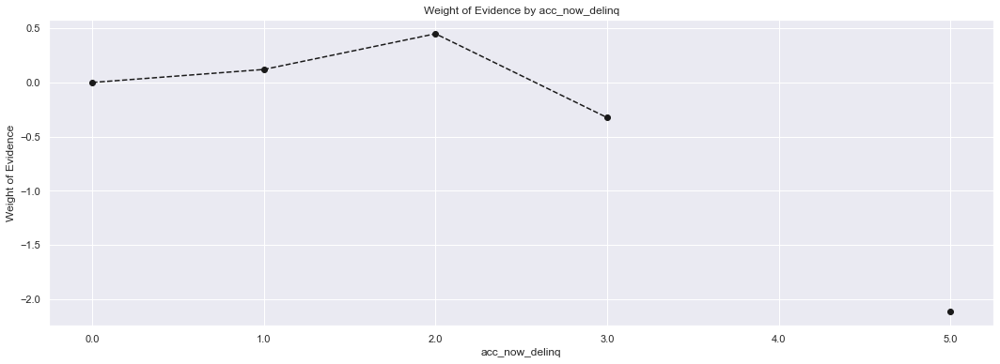

In [332]:
plot_by_woe(df_temp)

In [333]:
df_inputs_prepr['acc_now_delinq:0'] = np.where((df_inputs_prepr['acc_now_delinq'] == 0), 1, 0)
df_inputs_prepr['acc_now_delinq:>=1'] = np.where((df_inputs_prepr['acc_now_delinq'] >= 1), 1, 0)

In [334]:
# total_rev_hi_lim
df_inputs_prepr['total_rev_hi_lim_factor'] = pd.cut(df_inputs_prepr['total_rev_hi_lim'], 2000)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'total_rev_hi_lim_factor', df_targets_prepr)
df_temp

/Users/eric/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,total_rev_hi_lim_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-9999.999, 5000.0]",10011,0.880132,0.031608,8811.0,1200.0,0.030878,0.038243,-0.213916,NaN,NaN,inf
1,"(5000.0, 9999.999]",36042,0.886826,0.113796,31963.0,4079.0,0.112015,0.129996,-0.148868,0.006695,0.065048,inf
2,"(9999.999, 14999.998]",46249,0.889035,0.146023,41117.0,5132.0,0.144095,0.163554,-0.126669,0.002209,0.022199,inf
3,"(14999.998, 19999.998]",43941,0.890080,0.138736,39111.0,4830.0,0.137065,0.153930,-0.116038,0.001044,0.010631,inf
4,"(19999.998, 24999.997]",36634,0.896326,0.115665,32836.0,3798.0,0.115074,0.121040,-0.050545,0.006246,0.065494,inf
5,"(24999.997, 29999.997]",29756,0.897869,0.093949,26717.0,3039.0,0.093630,0.096851,-0.033824,0.001544,0.016721,inf
6,"(29999.997, 34999.996]",23505,0.901170,0.074213,21182.0,2323.0,0.074233,0.074033,0.002697,0.003301,0.036521,inf
7,"(34999.996, 39999.996]",18613,0.911675,0.058767,16969.0,1644.0,0.059468,0.052393,0.126660,0.010505,0.123964,inf
8,"(39999.996, 44999.996]",14719,0.917250,0.046473,13501.0,1218.0,0.047314,0.038817,0.197958,0.005575,0.071298,inf
9,"(44999.996, 49999.995]",11585,0.913509,0.036578,10583.0,1002.0,0.037088,0.031933,0.149655,0.003741,0.048303,inf


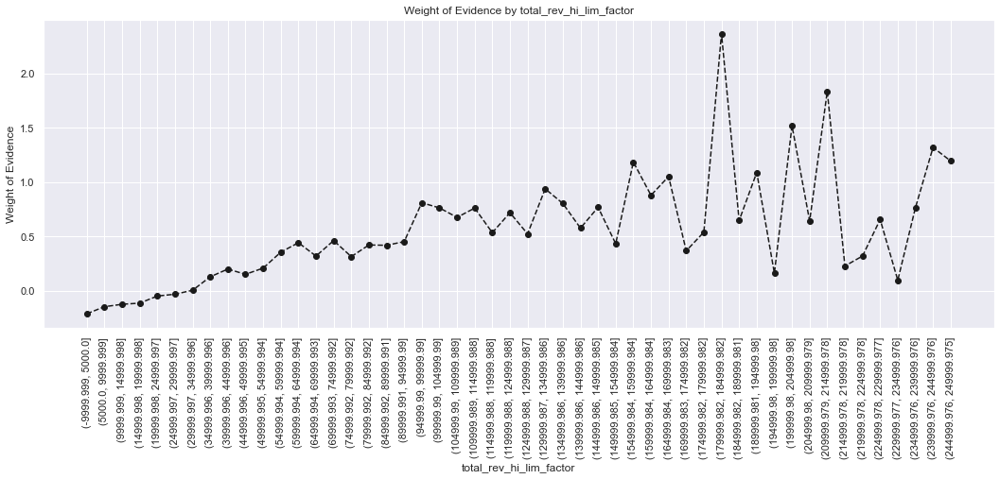

In [335]:
plot_by_woe(df_temp.iloc[: 50, : ], 90)

In [336]:
# Categories
# '<=5K', '5K-10K', '10K-20K', '20K-30K', '30K-40K', '40K-55K', '55K-95K', '>95K'
df_inputs_prepr['total_rev_hi_lim:<=5K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] <= 5000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:5K-10K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 5000) & (df_inputs_prepr['total_rev_hi_lim'] <= 10000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:10K-20K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 10000) & (df_inputs_prepr['total_rev_hi_lim'] <= 20000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:20K-30K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 20000) & (df_inputs_prepr['total_rev_hi_lim'] <= 30000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:30K-40K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 30000) & (df_inputs_prepr['total_rev_hi_lim'] <= 40000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:40K-55K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 40000) & (df_inputs_prepr['total_rev_hi_lim'] <= 55000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:55K-95K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 55000) & (df_inputs_prepr['total_rev_hi_lim'] <= 95000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:>95K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 95000), 1, 0)

In [337]:
# installment
df_inputs_prepr['installment_factor'] = pd.cut(df_inputs_prepr['installment'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'installment_factor', df_targets_prepr)
df_temp

,installment_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(14.276, 43.556]",1812,0.907285,0.004858,1644.0,168.0,0.004938,0.004188,0.164904,NaN,NaN,0.013515
1,"(43.556, 71.443]",4841,0.898162,0.012978,4348.0,493.0,0.013061,0.012288,0.060943,0.009123,0.103962,0.013515
2,"(71.443, 99.329]",6824,0.893757,0.018294,6099.0,725.0,0.018320,0.018071,0.013689,0.004404,0.047254,0.013515
3,"(99.329, 127.216]",9138,0.891223,0.024497,8144.0,994.0,0.024463,0.024776,-0.012720,0.002534,0.026409,0.013515
4,"(127.216, 155.102]",10040,0.898406,0.026915,9020.0,1020.0,0.027094,0.025424,0.063623,0.007183,0.076342,0.013515
5,"(155.102, 182.988]",16816,0.895397,0.045080,15057.0,1759.0,0.045229,0.043845,0.031078,0.003009,0.032544,0.013515
6,"(182.988, 210.875]",17216,0.906657,0.046152,15609.0,1607.0,0.046887,0.040056,0.157459,0.011259,0.126381,0.013515
7,"(210.875, 238.761]",15090,0.901856,0.040453,13609.0,1481.0,0.040879,0.036915,0.101995,0.004801,0.055465,0.013515
8,"(238.761, 266.648]",18842,0.902770,0.050511,17010.0,1832.0,0.051095,0.045664,0.112374,0.000915,0.010379,0.013515
9,"(266.648, 294.534]",20100,0.893134,0.053883,17952.0,2148.0,0.053925,0.053541,0.007145,0.009636,0.105229,0.013515


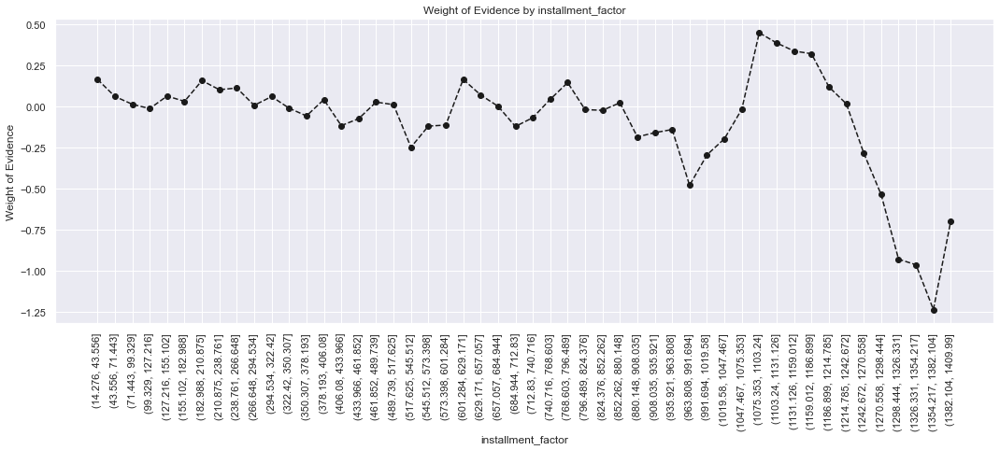

In [338]:
plot_by_woe(df_temp, 90)